#### 시각화 해서 나온 그림의 상대적인 위치(index 0은 파란선, index 1은 빨간선)와 영상 속 사람의 위치를 판단해서 index 0, 1이 각각 청샅바인지 홍샅바인지 판단한다. 그리고 해당 영상의 승자 판단하여 해당 json 파일을 index 0과 1 중 승자로 라벨링한다.

In [2]:
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from tqdm import tqdm

In [6]:
# 분석한 json 파일 가져오기, 파일 경로 부분만 수정하면 됨.
# with open("C:/Users/qudwn/OneDrive/바탕 화면/modified_json_files/청_김태하_혼합기술_밀어치기_승리기술_keypoints.json") as json_file:
    data = json.load(json_file)

In [3]:
# 시각화 결과가 잘 나올 수 있도록, x축, y축의 범위를 파악
def find_xy_axis_range(data, player_index='0', start_frame_index=0, last_frame_index=50):
    value_list = []
    for i in data[player_index][start_frame_index:last_frame_index]:
        if i == -1:
            continue
        for key, value in i.items():
            value_list.append(value)

    value_numpy = np.array(value_list)
    max_numpy = value_numpy.max(axis=0)
    min_numpy = value_numpy.min(axis=0)
    # print(f'x좌표 최대값: {max_numpy[0]}, y좌표 최대값: {-min_numpy[1]}') # 결과 값을 참고하여 시각화한 선이 다 나올 수 있도록 밑에 subplot x좌표, y좌표를 알맞게 수정
    # print(f'x좌표 최소값: {min_numpy[0]}, y좌표 최소값: {-max_numpy[1]}')
    x_range = [min_numpy[0], max_numpy[0]]
    y_range = [-max_numpy[1], -min_numpy[1]]
    return x_range, y_range

In [4]:
def plot_result(file_path, start_frame_index=0, last_frame_index=100, interval=5): # (분석할 json 데이터, 시각화할 프레임 첫번째 인덱스, 시각화할 프레임 마지막 인덱스, 시각화할 프레임 별 간격)

    with open(file_path) as json_file:
        data = json.load(json_file)

    # JSON 데이터에서 키포인트 정보 추출
    keypoints_data = data['0'][start_frame_index:last_frame_index+1:interval]
    keypoints_data2 = data['1'][start_frame_index:last_frame_index+1:interval]

    xrange_0, yrange_0 = find_xy_axis_range(data, player_index='0', start_frame_index=start_frame_index, last_frame_index=last_frame_index)
    xrange_1, yrange_1 = find_xy_axis_range(data, player_index='1', start_frame_index=start_frame_index, last_frame_index=last_frame_index)

    x_range = (np.array([xrange_0, xrange_1])[:, 0].min()-50, np.array([xrange_0, xrange_1])[:, 1].max()+50)
    y_range = (np.array([yrange_0, yrange_1])[:, 0].min()-50, np.array([yrange_0, yrange_1])[:, 1].max()+50)

    # COCO 데이터셋의 keypoint 연결 정보 (인덱스)
    keypoint_connections = [
            (0, 1), (0, 2), (1, 3), (2, 4),
            (5, 6), (5, 7), (7, 9), (6, 8),
            (8, 10), (5, 11), (6, 12), (11, 12),
            (11, 13), (12, 14), (13, 15), (14, 16)
        ]

    fig, axes = plt.subplots(4, 5, figsize=(60, 30))  # 이미지 담고 싶은 개수 표현(8*5), 원하는 크기로 조절

    # 각 서브플롯에 keypoint 데이터 시각화
    for i, ax in enumerate(axes.flat):
        if i < len(keypoints_data):
            ax.set_title(f'Subplot {i+1}')
            ax.set_xlim(x_range[0], x_range[1])  # x좌표 범위 조절
            ax.set_ylim(y_range[0], y_range[1])  # y좌표 범위 조절
            
            if keypoints_data[i] == -1 or keypoints_data2[i] == -1:  # nan 처리된 프레임의 정보는 건너뛴다. 시각화 결과가 백지로 나타남.
                continue

            # Keypoint를 순회하며 key point 시각화 - json 데이터 중 0번 인덱스
            for key, (x, y) in keypoints_data[i].items():

                ax.scatter(x, -y, s=1, label=f'Keypoint {key}', cmap='viridis')

            # Keypoint를 순회하며 key point 시각화 - json 데이터 중 1번 인덱스
            for key, (x, y) in keypoints_data2[i].items():
                
                ax2 = ax.twinx()
                ax2.scatter(x, -y, s=1, label=f'Keypoint {key}', cmap='viridis')
                
            
            # Keypoint 연결 정보를 사용하여 key point를 연결한 '파란색' 선을 그립니다. - json 데이터 중 0번 인덱스
            for connection in keypoint_connections:
                start_point = keypoints_data[i][str(connection[0])]
                end_point = keypoints_data[i][str(connection[1])]
                ax.plot([start_point[0], end_point[0]], [-start_point[1], -end_point[1]], linewidth=0.5, color='blue')
            
            # Keypoint 연결 정보를 사용하여 key point를 연결한 '빨간색' 선을 그립니다. - json 데이터 중 1번 인덱스
            for connection in keypoint_connections:
                start_point = keypoints_data2[i][str(connection[0])]
                end_point = keypoints_data2[i][str(connection[1])]
                ax2.plot([start_point[0], end_point[0]], [-start_point[1], -end_point[1]], linewidth=0.5, color='red')

        else:
            ax.axis('off')  # 비어있는 서브플롯은 비활성화

    plt.tight_layout()
    plt.show()

##### 시작 프레임, 종료 프레임, 프레임 간 간격 조절에 따른 결과 시각화, 프레임 순서는 (왼쪽 -> 오른쪽) -> (위 -> 아래) 순

In [14]:
path = 'C:/Users/qudwn/OneDrive/바탕 화면/json'
category_list = os.listdir(path)
category_list.sort()
len(category_list) # 파일들 총 개수 확인
for i in category_list:
    print(i)

16_person.json
17_person.json
18_person.json
19_person.json
20_person.json
21_person.json
22_person.json
23_person.json
24_person.json
25_person.json
26_person.json
27_person.json
28_person.json
29_person.json
30_person.json


Description:   0%|                             | 0/15 [00:00<?, ?it/s]

16_person.json


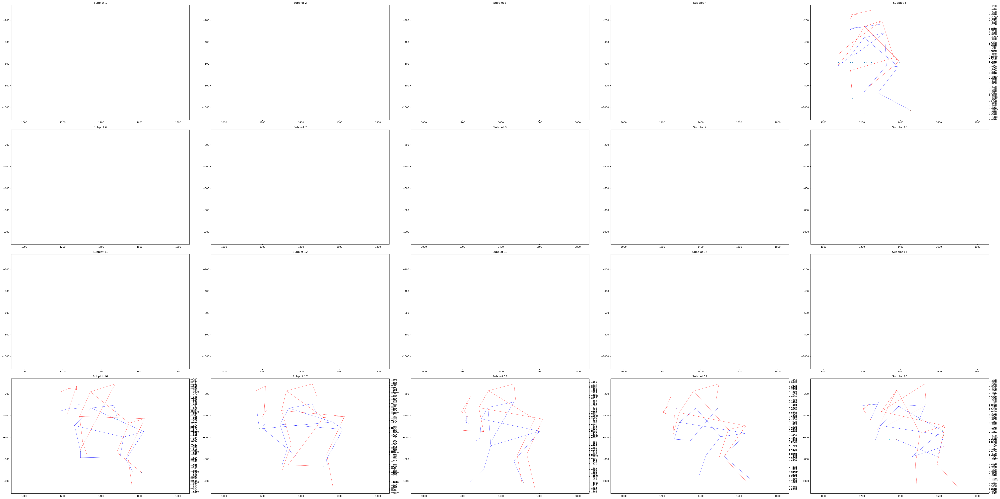

Description:   7%|=                    | 1/15 [00:10<02:32, 10.88s/it]

17_person.json


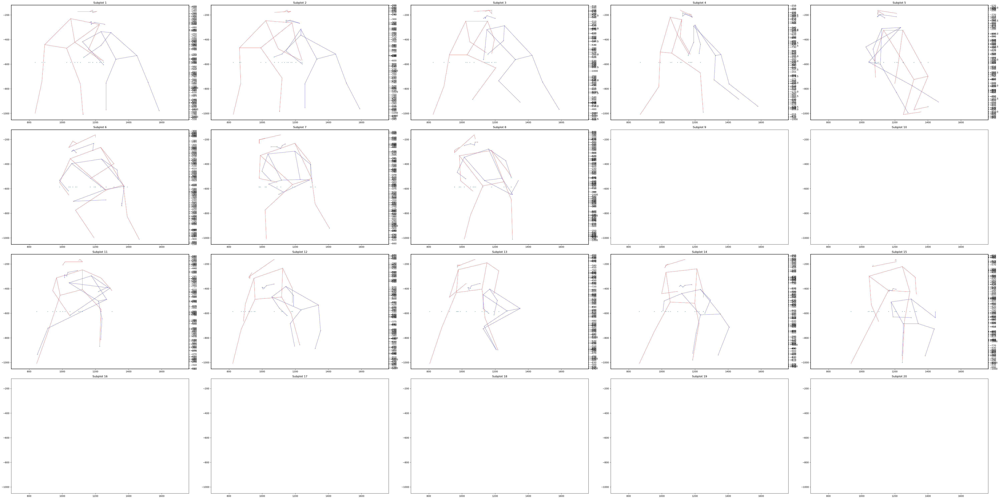

Description:  13%|==                   | 2/15 [00:48<05:48, 26.82s/it]

18_person.json


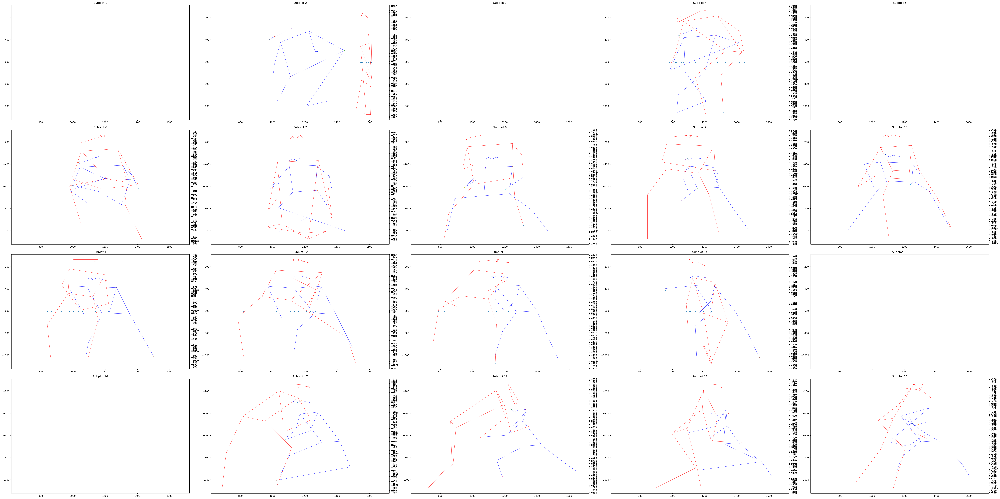

Description:  20%|====                 | 3/15 [01:29<06:39, 33.27s/it]

19_person.json


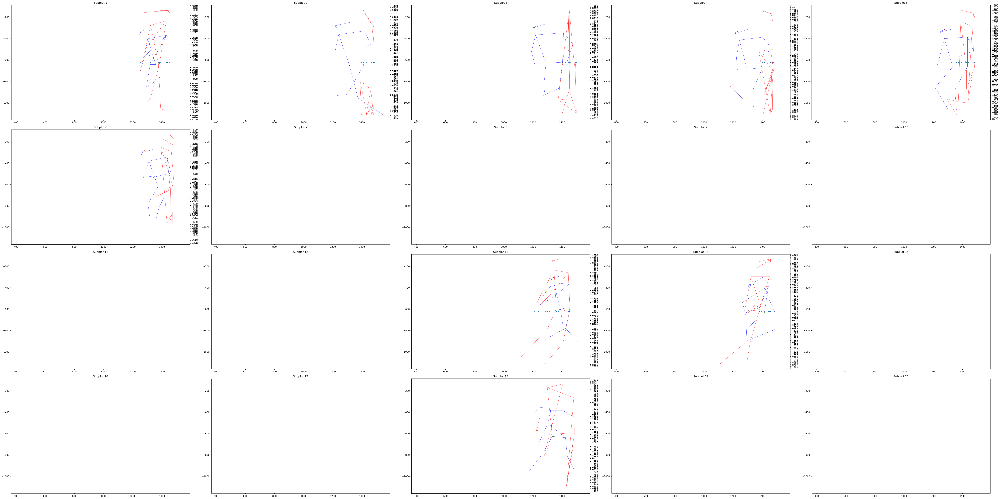

Description:  27%|=====                | 4/15 [01:53<05:25, 29.56s/it]

20_person.json


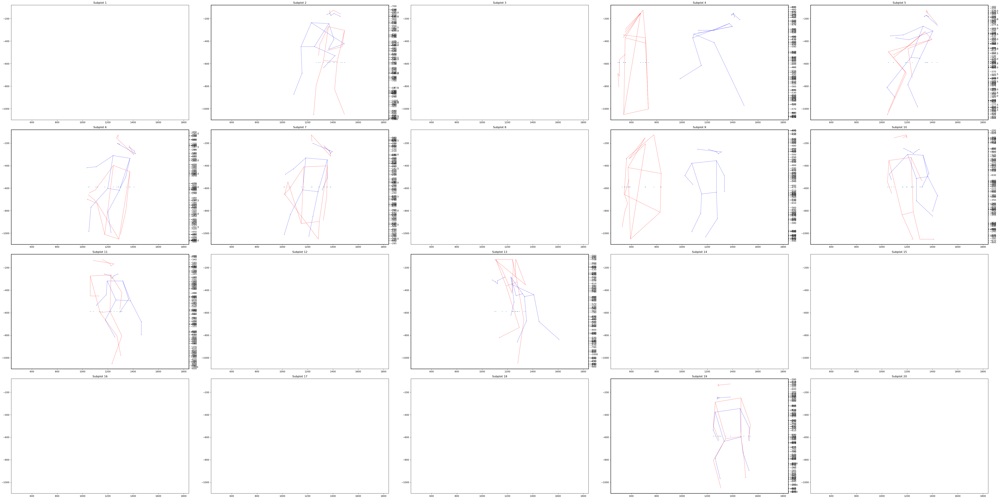

Description:  33%|=======              | 5/15 [02:24<05:01, 30.12s/it]

21_person.json


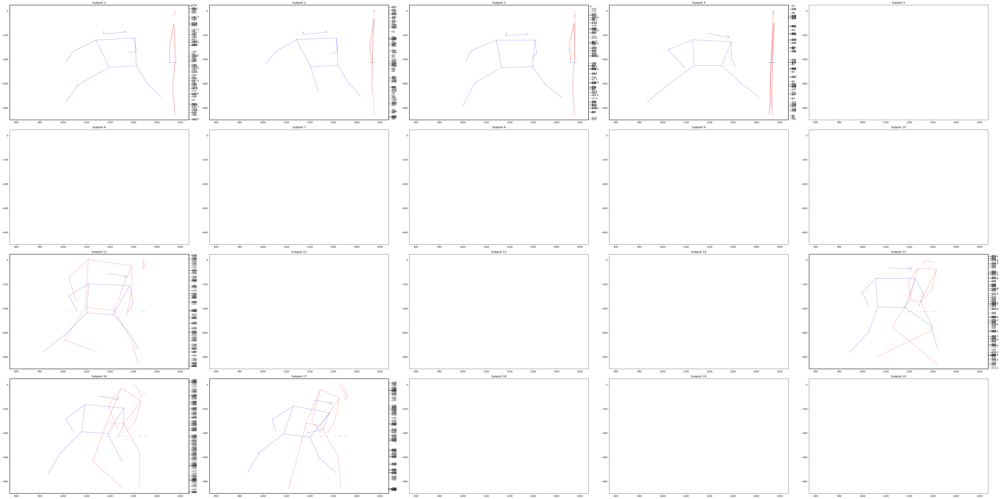

Description:  40%|========             | 6/15 [02:47<04:09, 27.74s/it]

22_person.json


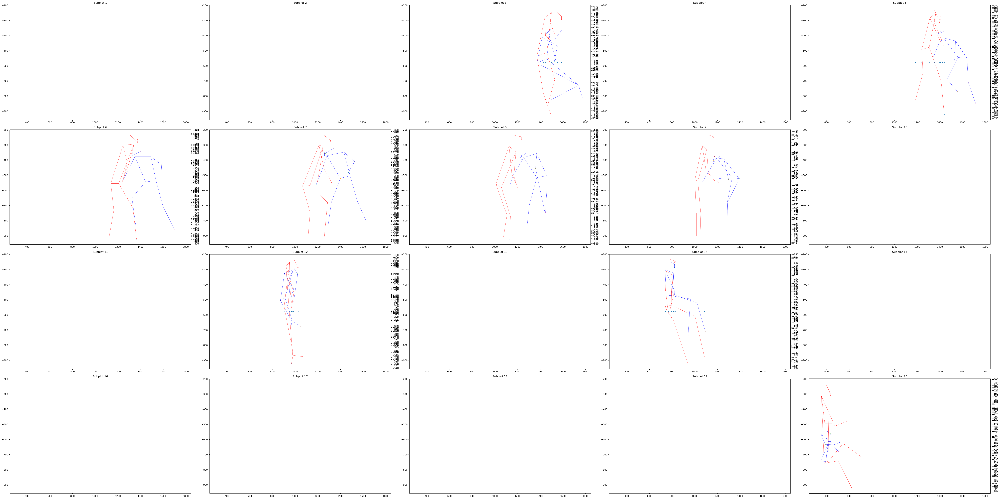

Description:  47%|=========            | 7/15 [03:09<03:25, 25.75s/it]

23_person.json


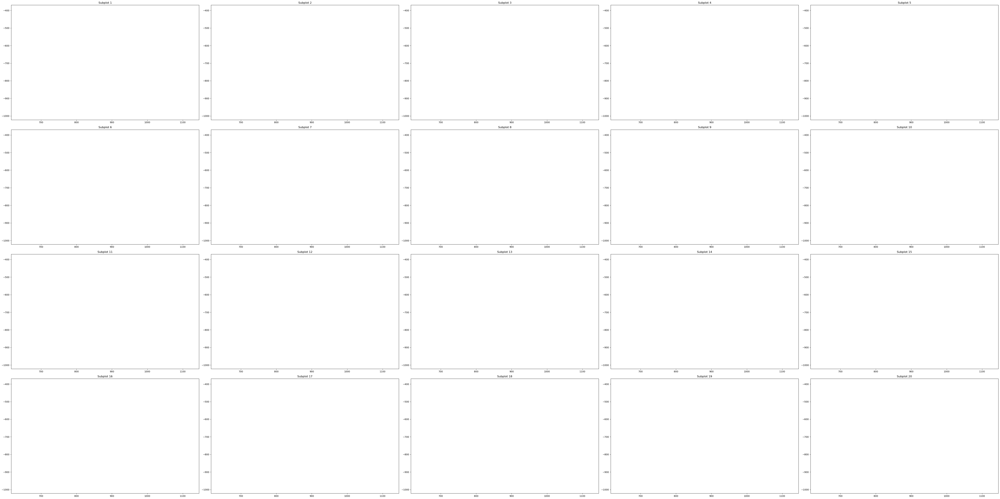

Description:  53%|===========          | 8/15 [03:11<02:07, 18.20s/it]

24_person.json


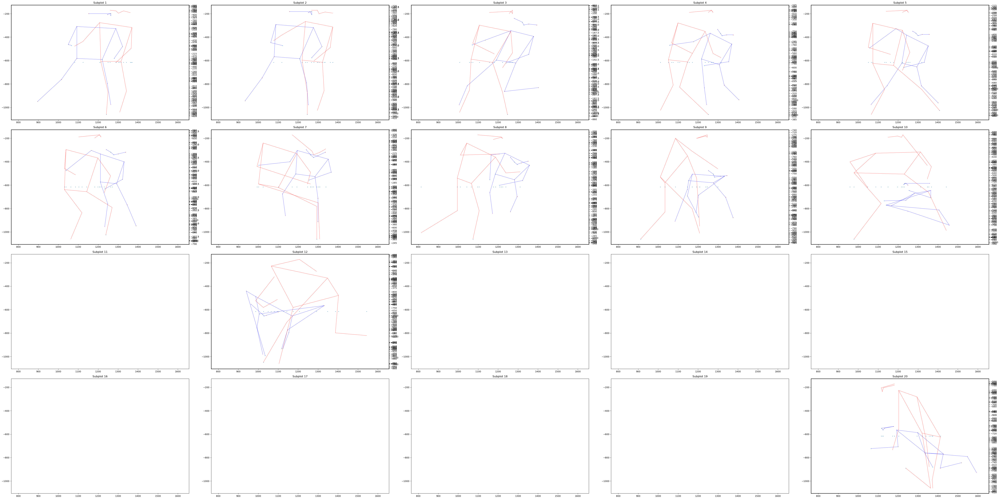

Description:  60%|============         | 9/15 [03:37<02:04, 20.67s/it]

25_person.json


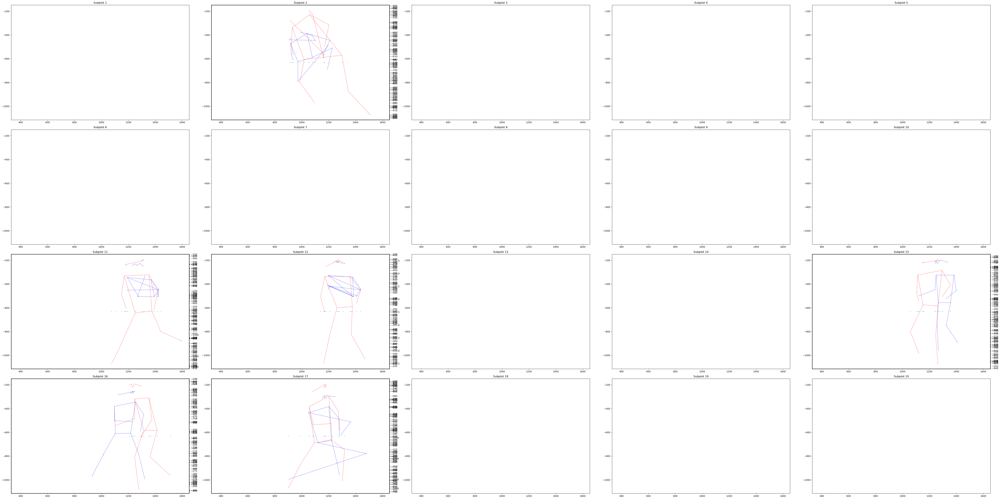

Description:  67%|=============       | 10/15 [03:58<01:42, 20.57s/it]

26_person.json


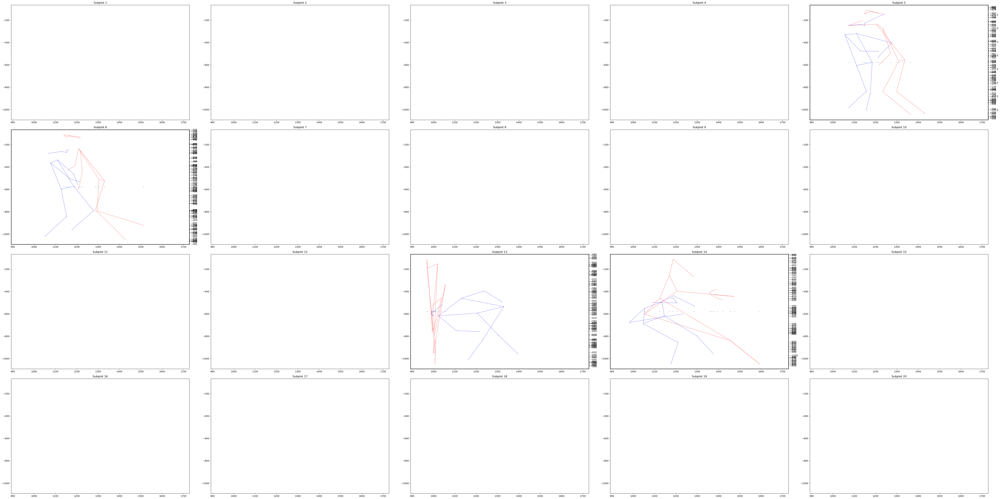

Description:  73%|==============      | 11/15 [04:12<01:14, 18.65s/it]

27_person.json


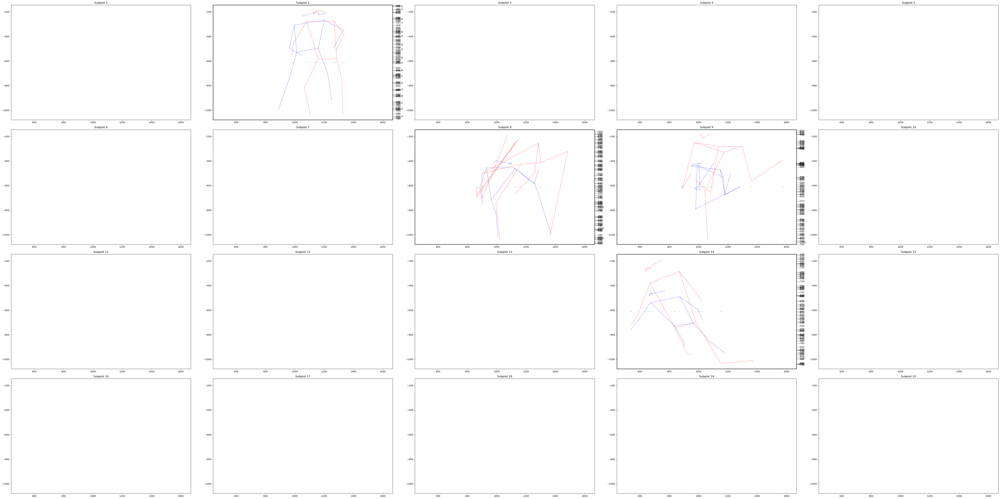

Description:  80%|================    | 12/15 [04:27<00:52, 17.48s/it]

28_person.json


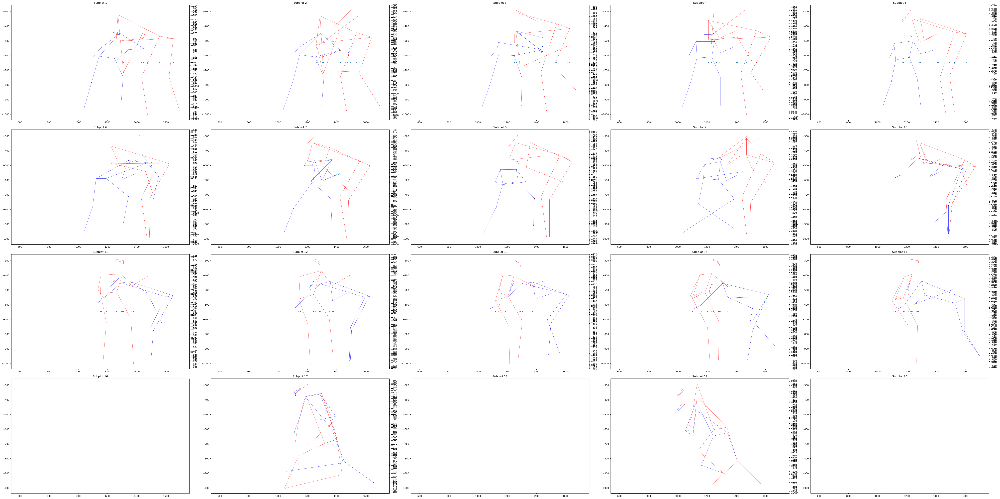

Description:  87%|=================   | 13/15 [05:12<00:51, 25.88s/it]

29_person.json


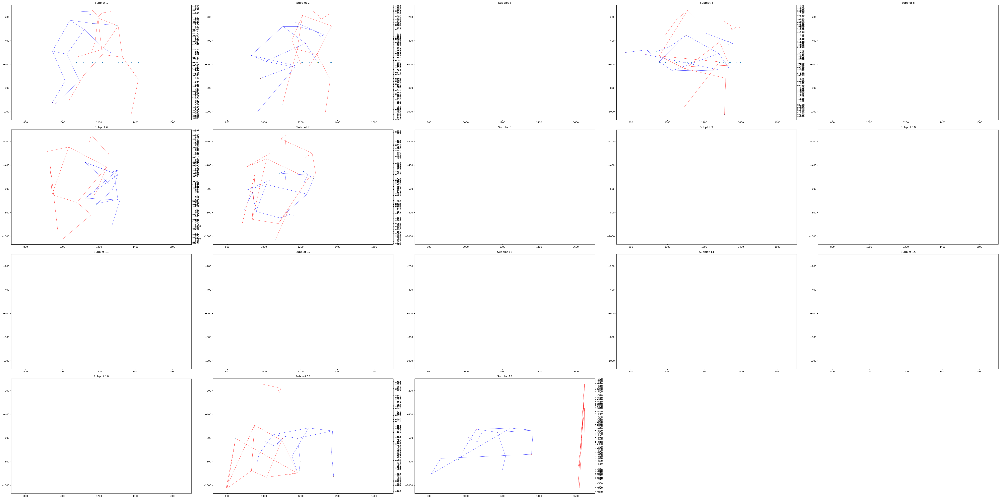

Description:  93%|==================  | 14/15 [05:34<00:24, 24.90s/it]

30_person.json


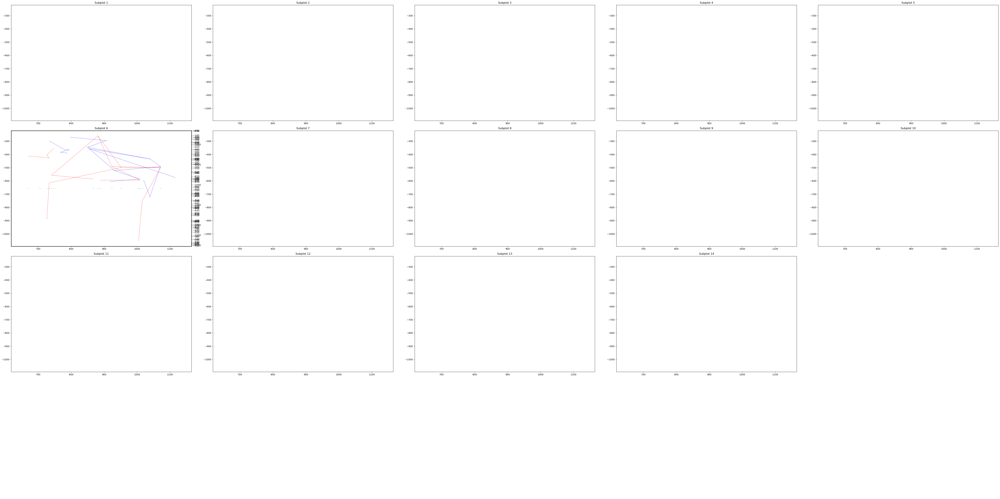

Description: 100%|====================| 15/15 [05:42<00:00, 22.85s/it]


In [19]:
path = 'C:/Users/qudwn/OneDrive/바탕 화면/json'
category_list = os.listdir(path)

for file_path in tqdm(category_list, total=len(category_list), ## 전체 진행수
              desc='Description', ## 진행률 앞쪽 출력 문장
              ncols=70, ## 진행률 출력 폭 조절
              ascii=' =', ## 바 모양, 첫 번째 문자는 공백이어야 작동
              leave=True): ## True 반복문 완료시 진행률 출력 남김. False 남기지 않음
    print(file_path)
    with open(path + '/' + file_path) as json_file:
        data = json.load(json_file)
    try:
        plot_result(path + '/' + file_path, start_frame_index=10, last_frame_index=(len(data['0'])-10), interval=3)

    except:
        print('문제발생')
        pass